<font face="B Mitra" size=4>
<div dir=rtl align=center>

<br>
<img src="https://aut.ac.ir/templates/tmpl_modern01/images/logo_fa.png" alt="Amirkabir University Logo" width="100">

<br>
<font size=2>
<b>دانشگاه صنعتی امیرکبیر - دانشکده ریاضی و علوم کامپیوتر</b>
</font>

<br>
<font size=6>
<b>گرافیک کامپیوتری</b>
</font>
<br>
استاد: دکتر مصطفی شمسی
<br>
<hr/>
<font size=6>
<b>تمرین اول</b>
</font>



<hr>
</div>
</font>


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
لطفا فایل نوت بوک نهایی را با الگوی زیر در سامانه کورسز آپلود کنید.
</font>
</p>

<div dir=ltr>
<font face="Times New Roman" size=4 dir=ltr>
شماره دانشجویی_CG_HW1.ipynb
</font>
</div>

</div>
</font>

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=6>
<b>OpenCV چیست؟</b>
</font>

<br>
<p align="justify">
<font size=4>
OpenCV یک کتابخانه منبع باز قدرتمند برای پردازش تصویر و بینایی ماشین است که توسط مجموعه‌ای از ابزارها و توابع برنامه‌نویسی، امکان تشخیص و تحلیل تصاویر و ویدیوها را فراهم می‌کند. این کتابخانه توسط Willow Garage توسعه یافته و در حال حاضر توسط یک جامعه گسترده از برنامه‌نویسان و محققان در سراسر جهان حمایت می‌شود.
از کاربردهای اصلی OpenCV می‌توان به موارد زیر اشاره کرد:
<ol>
  <li>تشخیص چهره</li>
  <li>تعقیب اشیاء</li>
  <li>تشخیص شیء</li>
  <li>برچسب‌گذاری تصاویر</li>
  <li>پردازش تصاویر پزشکی</li>
</ol>
</font>
</p>

</div>
</font>

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=6>
<b>عملیات مقدماتی در OpenCV:</b>
</font>

<br>
<p>
<font size=4>
در این کارگاه قصد داریم مطالب زیر را پوشش دهیم:
<ol>
  <li>خواندن و نمایش تصاویر</li>
  <li>دسترسی به مقادیر پیکسل و تغییر آنها</li>
  <li>دسترسی به ویژگی های تصویر</li>
  <li>تنظیم ناحیه مورد نظر از تصویر</li>
  <li>تقسیم و ادغام کانال‌های تصاویر</li>
  <li>عملیات حسابی بر روی تصاویر</li>
  <li>عملیات ابتدایی در پردازش تصویر</li>
  <li>کنتراست و روشنایی</li>
</ol>
نکته: در این کارگاه علاوه بر OpenCV از کتابخانه‌های
<a href="https://numpy.org/doc/stable/">numpy</a> و
<a href="https://matplotlib.org/stable/users/index.html">matplotlib</a>
استفاده شده است.
</font>
</p>
<hr/>
</div>
</font>

<font face="B Mitra">
<div dir=rtl>

<font size=5>
<b>بارگذاری کتابخانه‌ها و توابع کمکی مورد نیاز</b>
</font>

</div>
</font>

In [1]:
import cv2
import math
import requests # For reading image from URL
import numpy as np
import matplotlib.pylab as plt
from io import BytesIO
from PIL import Image
from google.colab.patches import cv2_imshow # For displaying image in Google Colab

def read_image_from_url(url, flags=cv2.IMREAD_COLOR):
    response = requests.get(url)
    response.raise_for_status()
    img_array = np.array(bytearray(response.content), dtype=np.uint8)
    img = cv2.imdecode(img_array, flags)
    return img

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۱. خواندن و نمایش تصاویر</b>
</font>

<br>
<p align="justify">
<font size=4>
در این مرحله قصد داریم تصاویر را از URL‌های
مختلف بخوانیم و سپس آنها را نمایش دهیم.

* import cv2:
برای کار با تصاویر و انجام عملیات پردازش تصویر مانند خواندن، نمایش و ویرایش تصویر از کتابخانه‌ی OpenCV استفاده می‌شود.

* import math:
این کتابخانه برای انجام عملیات ریاضی مثل توابع مثلثاتی و سایر محاسبات ریاضی
پیشرفته استفاده می‌شود

* import requests:
این کتابخانه برای ارسال درخواست‌های HTTP استفاده می‌شود. در اینجا برای دریافت تصویر از یک URL به کار رفته است.

* import numpy as np:
 نامپای یک کتابخانه محبوب برای کار با آرایه‌ها و ماتریس‌ها است. برای تبدیل داده‌های تصویر به آرایه‌های مناسب OpenCV استفاده می‌شود.

* import matplotlib.pylab as plt:
برای ترسیم گرافیک و رسم نمودارها از این کتابخانه استفاده می‌شود.

* from google.colab.patches import cv2_imshow:
این تابع برای نمایش تصاویر در محیط Google Colab استفاده می‌شود. معمولاً OpenCV تابعی به نام cv2.imshow() برای نمایش تصاویر دارد، اما این تابع در Google Colab کار نمی‌کند. به همین دلیل از cv2_imshow() استفاده می‌شود.

در ادامه تابع read_image_from_url را بررسی می‌کنیم:

1. response = requests.get(url):
این خط با استفاده از کتابخانه Requests، یک درخواست HTTP به URL مشخص‌شده ارسال می‌کند و پاسخ را به شکل یک شیء response ذخیره می‌کند.
2. response.raise_for_status():
این خط بررسی می‌کند که آیا درخواست موفقیت‌آمیز بوده یا خیر. اگر درخواست به هر دلیلی (مثل URL نامعتبر یا مشکلات دیگر) با خطا مواجه شود، این خط یک Exception (استثنا) ایجاد می‌کند.
3. img_array = np.array(bytearray(response.content), dtype=np.uint8):
این خط کمی پیچیده‌تر است و چند مرحله دارد:

  3.1 response.content: محتوای باینری پاسخ HTTP را به دست می‌آورد (که تصویر به صورت بایت‌های خام است).

  3.2 bytearray(response.content): محتوای تصویر را به یک آرایه از بایت‌ها تبدیل می‌کند.

  3.3 np.asarray(..., dtype=np.uint8): آرایه بایت‌ها را به یک آرایه NumPy از نوع uint8 تبدیل می‌کند که می‌تواند توسط OpenCV مورد استفاده قرار گیرد.

4. img = cv2.imdecode(img_array, flags): این تابع محتوای بایت تصویر را به یک تصویر OpenCV تبدیل می‌کند. flags به صورت پیشفرض cv2.IMREAD_COLOR در نظر گرفته شده است و به این معنی است که تصویر به صورت رنگی خوانده می‌شود (سه کانال BGR).

5. return img:
در نهایت، تصویر پردازش شده به فرمت OpenCV به عنوان خروجی برمی‌گردد.
</font>
</p>

</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<p align="justify">
<font size=4 color="lightgreen">

نکته ۱: هنگام خواندن تصاویر به تفاوت‌های BGR و RGB دقت کنید.
در OpenCV کانال‌های ورودی برای خواند تصاویر به صورت پیشفرض BGR می‌باشد. مثلا در تصاویر پایین، تصویر سمت راستی که در قالب RGB می‌باشد و هنگامی که به OpenCV داده می‌شود که این تصویر را بخواند، تصویر به درستی نمایش داده نمی‌شود.
</font>


<font size=4 color="lightblue">
نکته ۲: بدلیل استفاده از Google Colab و URL تصاویر، امکان استفاده از قطعه کد‌های زیر جهت خواندن و نمایش تصویر نیست. در صورتی که فایل را در ادیتور یا IDE خود به صورت لوکال باز کرده‌اید از کدهای زیر می‌توانید استفاده کنید.
</font>

خواندن تصویر:
<div dir=ltr>
<font size=5>
<code>
cv2.imread("image location", a flag which specifies the way image should be read.)
</code>
</font>
</div>

<font face="Times New Roman" size=4 dir=ltr>
<ul>
flags:
<li>cv2.IMREAD_COLOR(or 1): Loads a color image. Any transparency of image will be neglected. It is the default flag.</li>
<li>cv2.IMREAD_GRAYSCALE(or 0): Loads image in grayscale mode</li>
<li>cv2.IMREAD_UNCHANGED(or -1): Loads image as such including alpha channel</li>
</ul>
</font>

نمایش تصاویر:
<div dir=ltr>
<font size=5>
<code>
cv2.imshow("window name", our image variable) <br>
cv2.waitKey(0) # The function waits for specified milliseconds for any keyboard event. If 0 is passed, it waits indefinitely for a key stroke.<br>
cv2.destroyAllWindows() # Simply destroys all the windows we created.
</code>
</font>
</div>

یا

<div dir=ltr>
<font size=5>
<code>
plt.imshow(our image variable)
</code>
</font>
</div>

</font>
</p>

</div>
</font>
</font>

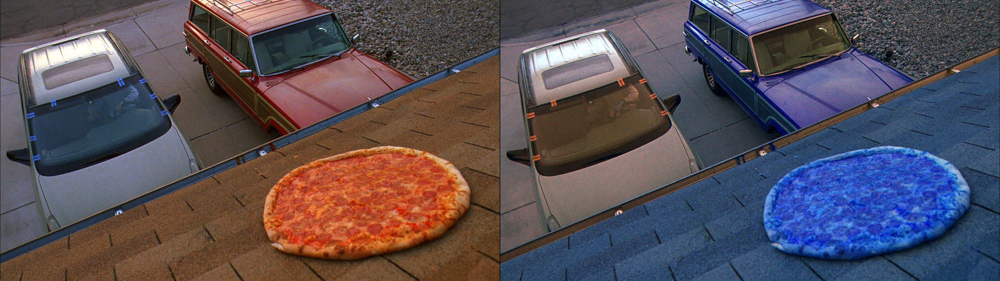

In [2]:
# Create a list to store the urls of the images
url =  "https://api.time.com/wp-content/uploads/2019/10/breaking-bad-pizza.jpg?quality=85&w=960&h=540&crop=1"

image = read_image_from_url(url) # Read the image from URL using OpenCV + requests
image_2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB channel
final_frame = cv2.hconcat((image, image_2)) # Concatenate the BGR image to RGB image
cv2_imshow(final_frame) # Display the image


<div dir=rtl>
<p align="justify">
<font face="B Mitra" size=4>
این کد تصاویر را از URL ها دانلود می‌کند، نسخه‌ای از آنها را از BGR به RGB تبدیل می‌کند، هر دو نسخه را کنار هم قرار می‌دهد و آن‌ها را نمایش می‌دهد.

</font>
</div>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۱:</b>
</font>

<br>
<p>
<font size=4>
حال که با نحوه خواندن و نمایش تصاویر آشنا شدید، به دلخواه آدرس یک تصویر را کپی کرده و آنرا در هر دو فرمت RGB و BGR نمایش دهید.
</font>
</p>

</div>
</font>

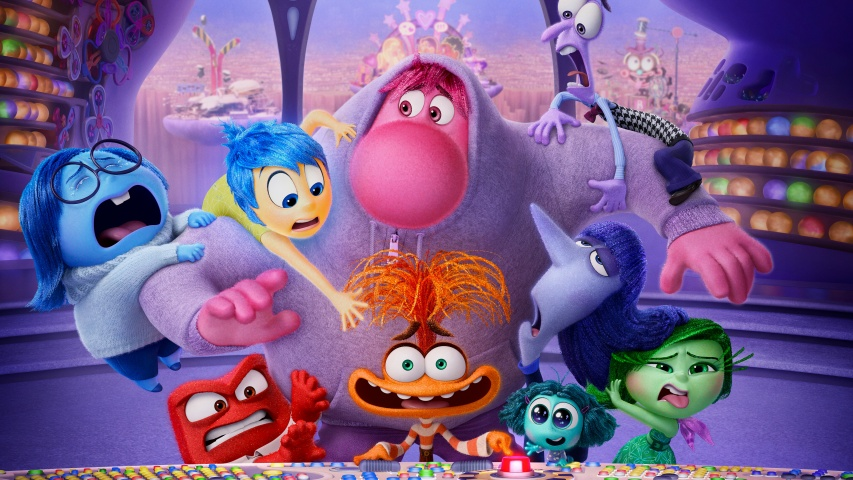

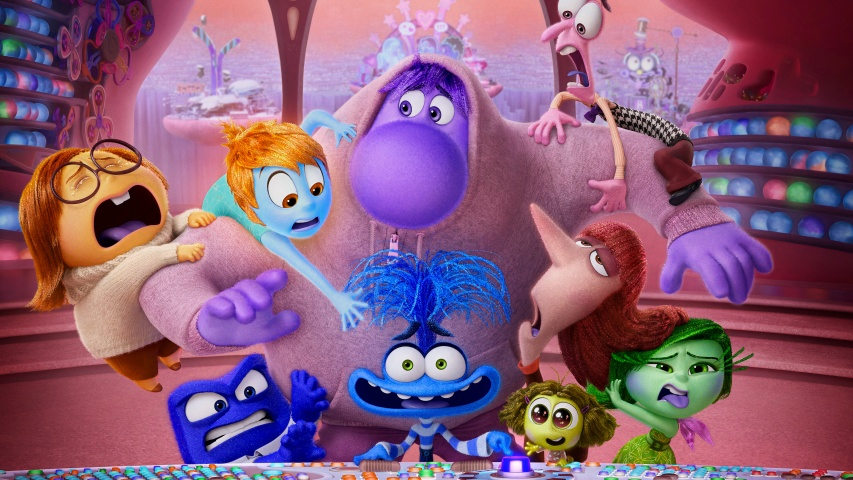

In [3]:
## TODO1: Read and Display an image
url = "https://4kwallpapers.com/images/wallpapers/inside-out-2-movie-853x480-16762.jpg"
myImg = read_image_from_url(url)
### START
cv2_imshow(myImg) # BGR image output
myImg = cv2.cvtColor(myImg, cv2.COLOR_BGR2RGB) # Convert to RGB
cv2_imshow(myImg) # RGB image output
### END

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>2. دسترسی به ویژگی های تصویر</b>
</font>

<br>
<p>
<font size=4>
ویژگی های تصویر شامل تعداد سطر، ستون، کانال، نوع داده های تصویری، تعداد پیکسل و غیره.

اگر تصویر رنگی باشد دستور <code>shape</code> یک tuple از تعداد سطر و ستون و تعداد کانال‌های تصویر به ما می‌دهد. و اگر تصویر grayscale باشد یک tuple از تعداد سطر و ستون را خروجی می‌دهد.
</font>
</p>


</div>
</font>

In [4]:
print("Image shape(#row, #column, #channel):", myImg.shape)

Image shape(#row, #column, #channel): (480, 853, 3)


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
برای فهمیدن تعداد پیکسل‌های یک تصویر از دستور <code>size</code> استفاده می‌کنیم.
</font>
</p>


</div>
</font>

In [5]:
print("# Pixels:", myImg.size)

# Pixels: 1228320


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
برای فهمیدن نوع داده یک تصویر از دستور <code>dtype</code> استفاده می‌کنیم.
</font>
</p>


</div>
</font>

In [6]:
print("Image datatype:",myImg.dtype)

Image datatype: uint8


<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>3. دسترسی به مقادیر پیکسل و تغییر آنها</b>
</font>

<br>
<p>
<font size=4>
شما می‌توانید به مقدار یک پیکسل با استفاده از مختصات ردیف و ستون آن دسترسی پیدا کنید. برای تصویر BGR، آرایه‌ای از مقادیر آبی، سبز، قرمز را برمی‌گرداند. برای تصویر خاکستری، فقط شدت متناظر برگردانده می‌شود.
</font>
</p>

<br>
<div style="display: flex; justify-content: center;">
  <img src="https://static.packt-cdn.com/products/9781789344912/graphics/assets/ef884cf4-46f9-4db1-b473-ed80ecbc2593.png" alt="Image 1" width="400">
  <img src="https://static.packt-cdn.com/products/9781789344912/graphics/assets/a4bb6560-4c40-4de2-b88f-8e08b69cf7ab.png" alt="Image 2" width="400">
</div>

</div>
</font>

In [7]:
url = "https://static.scientificamerican.com/sciam/cache/file/DB4E849F-5267-4A4C-A8A1F8AB1344C945_source.jpg?w=590&h=800&8397FFEE-1F26-49BC-98ECB53FE3F8A6D6"
img = read_image_from_url(url)

blue, green, red = img[:, :, 0], img[:, :, 1], img[:, :, 2]

Blue: 
[[201 201 201 ... 186 186 186]
 [201 201 201 ... 186 186 186]
 [202 202 202 ... 186 186 186]
 ...
 [ 15  38  55 ... 131 121 174]
 [ 37  18  55 ... 153 114 171]
 [ 73  27  58 ... 143  93 134]]


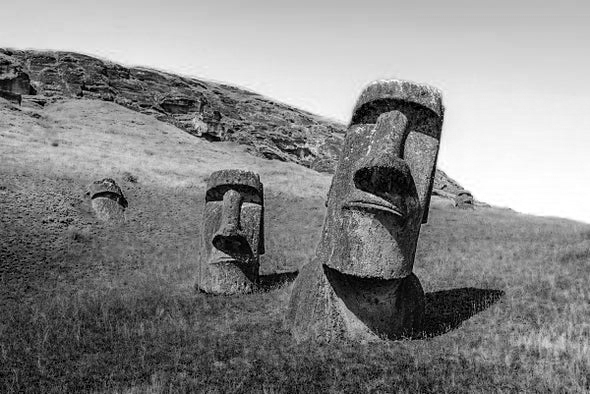

In [8]:
print("Blue: ")
print(blue)
cv2_imshow(blue)

Green: 
[[132 132 132 ... 115 115 115]
 [132 132 132 ... 115 115 115]
 [133 133 133 ... 115 115 115]
 ...
 [126 150 164 ... 215 198 251]
 [145 127 164 ... 217 177 232]
 [181 135 164 ... 199 147 187]]


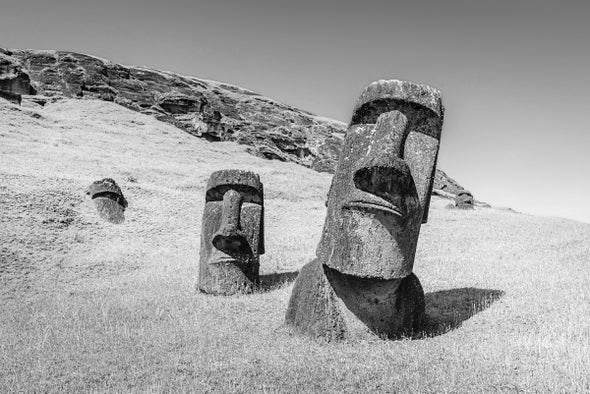

In [9]:
print("Green: ")
print(green)
cv2_imshow(green)

Red: 
[[  0   0   0 ...   1   1   1]
 [  0   0   0 ...   1   1   1]
 [  0   0   0 ...   1   1   1]
 ...
 [118 140 155 ... 211 194 244]
 [139 119 156 ... 221 175 228]
 [175 129 158 ... 204 148 184]]


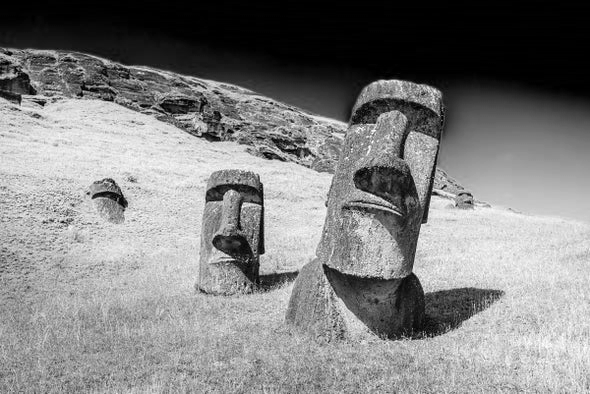

In [10]:
print("Red: ")
print(red)
cv2_imshow(red)

In [11]:
px = img[100,100]
print("Pixel(100,100)(Blue, Green, Red):",px)

# accessing only blue pixel
blue = img[100,100,0]
print("Blue:", blue)

Pixel(100,100)(Blue, Green, Red): [157 193 201]
Blue: 157


<font face="B Mitra" size=5>
<div dir=rtl>
<p>
<font size=4>
همچنین ما می‌توانیم مقادیر یک پیکسل را تغییر دهیم. اما دسترسی به هر یک از مقادیر پیکسل و تغییر آن بسیار روشی کند است و صرفا برای درک مفاهیم در اینجا ذکر شده است.

</div>
</font>

In [12]:
print("‌‌Bfore editing pixel:", px)
px = [0, 0, 0]
print("After editing pixel:", px)

‌‌Bfore editing pixel: [157 193 201]
After editing pixel: [0, 0, 0]


<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>4. تقسیم و ادغام کانال‌های تصاویر</b>
</font>

<br>
<p>
<font size=4>
گاهی اوقات لازم است به طور جداگانه روی کانال‌های B، G، R یک تصویر کار کنید. در این مورد، باید تصویر BGR یا RGB را به کانال های جدا تقسیم کنید. در موارد دیگر، ممکن است لازم باشد برای ایجاد یک تصویر BGR این کانال‌ها را در کنار هم قرار دهید.
همانطور که مشاهده می‌کنید کانال‌های تصویر را جدا کرده‌ایم و تصویر کانال آبی را به نمایش گذاشتیم. دقت کنید که تصویر grayscale شده شدت رنگ آبی را به ما نشان میدهد برای درک بیشتر می‌توانید تصویر قرمز (r) را خروجی بگیرید و ببینید که چه تغییری در تصویر ایجاد می‌شود.
<br>
<font size=4, color="lightgreen">
نکته: کانال‌های ورودی در matplotlib به صورت RGB می‌باشد بنابراین برای نمایش تصاویر با matplotlib که با استفاده از OpenCV خوانده شده‌اند باید ابتدا تصویر را به RGB تبدیل کنیم و سپس آن را با matplotlib نمایش دهیم.
</font>
</p>


</div>
</font>

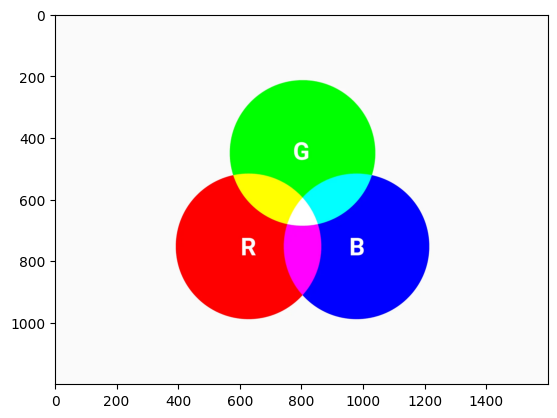

In [13]:
img = read_image_from_url("https://media.crystallize.com/snowball/20/3/4/4/@1600/color-systems-rgb.webp")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

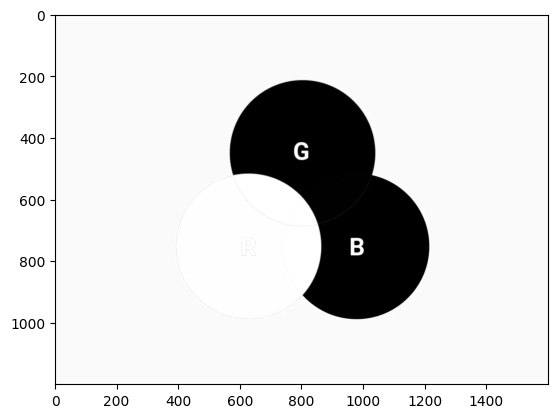

In [14]:
# split channels
r, g, b = cv2.split(img)
# show one of the channels (this is blue. try changing it to r)
plt.imshow(r, cmap='gray')
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین 2:</b>
</font>

<br>
<p>
<font size=4>
در ادامه می‌خواهیم با تابع cv2.merge() یک تصویر تشکیل دهیم. نیمه سمت چپ تصویر باید به رنگ سبز و نیمه سمت راست آن به رنگ آبی باشد. مشابه کانال قرمز که در بلاک زیر قرار دارد، دیگر کانال‌ها را نیز تشکیل دهید و در نهایت تصویر به دست آمده را نمایش دهید.
</font>
</p>

</div>
</font>

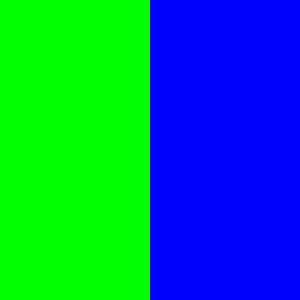

In [15]:
height, width = 300, 300
red_channel = np.zeros((height, width), dtype=np.uint8)

# TODO: Make green and blue channel
blue_channel = np.zeros((height, width), dtype=np.uint8)
blue_channel[:, 150:300] = 255
green_channel = np.zeros((height, width), dtype=np.uint8)
green_channel[:, 0:150] = 255

merged_image = cv2.merge([blue_channel, green_channel, red_channel])
cv2_imshow(merged_image)

<hr>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>5. تصاویر باینری، تک‌رنگ(Monochrome)، خاکستری(Grayscale)</b>
</font>

<br>
<font size=4>
<p>تصاویر دیجیتال علاوه بر تصاویر رنگی به دسته‌های زیر تقسیم می‌شوند:</p>

<ol>
  <li>تصاویر خاکستری (Grayscale)</li>
  <li>تصاویر باینری (Binary)</li>
  <li>تصاویر تک‌رنگ (Monochrome)</li>
  
</ol>

<p align="justify">

<b>5.۱ تبدیل به خاکستری</b>


تبدیل به تصویر خاکستری، فرآیندی است که تصویر رنگی را به یک کانال تکی کاهش می‌دهد که نماینده شدت هر پیکسل است. این کار تصویر را برای وظایف مختلف پردازش تصویر ساده می‌کند.
</font>
</p>
</div>
</font>

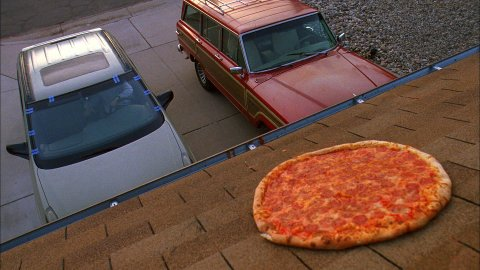

In [16]:
image = read_image_from_url("https://api.time.com/wp-content/uploads/2019/10/breaking-bad-pizza.jpg?quality=85&w=480&h=270&crop=1")
cv2_imshow(image)

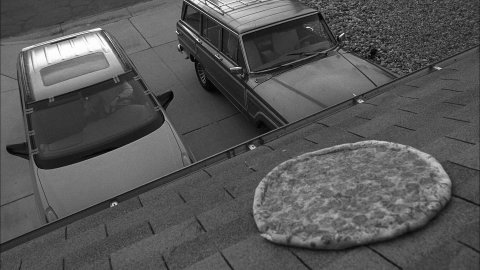

In [17]:
grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(grayscale_image)

<font face="B Mitra" size=5>
<div dir=rtl>


<p align="justify">
<font size=4>
<b>5.۲ تبدیل به باینری </b>

تبدیل به تصویر باینری شامل تبدیل تصویر به یک فرمت سیاه و سفید است، به طوری که هر پیکسل به صورت کاملاً سیاه یا کاملاً سفید باشد. این کار معمولاً با استفاده از  Thresholding به دست می‌آید. در صورتی که عمیق بیت تصویر 8 باشد می‌تواند عدد 128 که در وسط بازه مقادیر ممکن برای پیکسل‌ها قرار دارد را به عنوان آستانه در نظر گرفت.

</p>


</div>
</font>

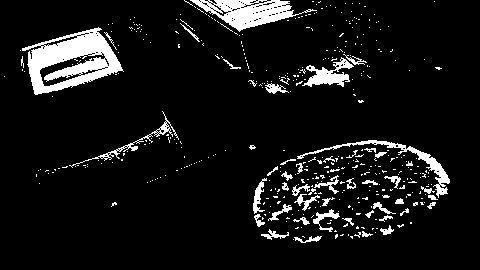

In [18]:
threshold_value = 128
max_value = 255
ret, binary_image = cv2.threshold(grayscale_image, threshold_value, max_value, cv2.THRESH_BINARY)

cv2_imshow(binary_image)

<font face="B Mitra" size=5>
<div dir=rtl>


<p align="justify">
<font size=4>
<b>5.3 تبدیل به تک رنگ </b>

تبدیل به تصویر تک رنگ، فرآیندی است که در آن تصویر به تصویری تبدیل می‌شود که تنها شامل یک طیف رنگی است. بدین منظور می‌توانیم از دو رویکرد استفاده کنیم:

<ol>
<li> بدون تغییر نگه داشتن کانال رنگی موردنظر و صفر کردن دیگر کانال‌های رنگی</li>
<li> تبدیل تصویر به تصویر خاکستری و قرار دادن آن در کانال رنگی مورد نظر و صفر کردن دیگر کانال‌های رنگی</li>
</ol>

</p>


</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b> تمرین 3:</b>
</font>

<br>
<p>
<font size=4>
دو روش گفته شده را بر روی تصویر قبلی انجام دهید.
  </li>
</ol>
</p>

</div>
</font>

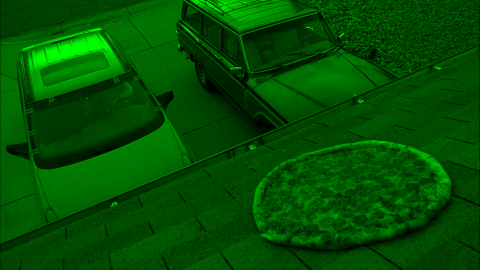

In [19]:
method1_image = image.copy()

# TODO: Method 1
blue, green, red = cv2.split(method1_image)
# Turn into Green
blue[:, :] = 0
red[:, :] = 0
method1_image = cv2.merge([blue, green, red])

cv2_imshow(method1_image)

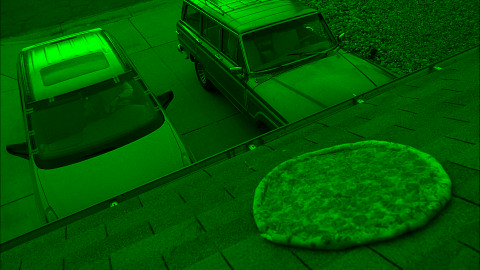

In [20]:
method2_image = image.copy()

# TODO: Method 2
gray_image = cv2.cvtColor(method2_image, cv2.COLOR_BGR2GRAY)
# Turn into Green
method2_image = cv2.merge([np.zeros_like(gray_image), gray_image, np.zeros_like(gray_image)])

cv2_imshow(method2_image)

<font face="B Mitra" size=5>
<div dir=rtl>
<p>
<font size=4, color='lightgreen'>
خروجی دو روش را مقایسه کنید. به نظر شما کدام روش مناسب تر است؟ چرا؟
</p>
</div>
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
در این مثال خاص نتایج خروجی دو روش تفاوت آنچنان زیادی با یکدیگر ندارند اما به نظر می‌رسد روش دوم به دلیل حفظ اطلاعات روشنایی و پتانسیل بالای آن برای پردازش‌های اضافی انتخاب مناسب‌تری است و خروجی آن تا حدی بهتر می‌باشد.
<p>
در روش اول تصویر نهایی وضوح بیش‌تری از رنگ مورد نظر را نشان می‌دهد و می‌توان به سادگی تغییرات در آن رنگ خاص را دید. همچنین پیاده‌سازی بسیار ساده و سریعی دارد،اما از معایب آن این است که اگر تصویر شامل رنگ‌های متنوع باشد، این روش ممکن است باعث نادیده گرفته شدن اطلاعات ارزشمند شود.
<p>
در روش دوم، چون تصویر به حالت خاکستری تبدیل می‌شود، به معنی ترکیب تمام کانال‌های رنگی و نگه داشتن روشنایی آن‌هاست. این روش اطلاعات روشنایی را حفظ کرده و تصویر نهایی نمای کلی‌تری از طرح روشنایی و تاریکی را نشان می‌دهد. همچنین برای تحلیل‌های بیش‌تر یا تشخیص مشخصات مفید است. از معایب این روش این است که نسبت به روش اول ممکن است پیاده‌سازی پیچیده‌تری داشته باشد و همچنین به دلیل از بین رفتن رنگ‌ها در فرایند تبدیل به خاکستری، تصویر نهایی ممکن است جذابیت کم‌تری داشته باشد.
<p>
بنابراین به صورت کلی، اگر ما به دنبال حفظ اطلاعات رنگی و وضوح مشخصی از یک رنگ هستیم، روش اول گزینه‌ی مناسبی است، اما اگر هدف ما حفظ اطلاعات روشنایی و تجزیه و تحلیل بیش‌تر تصویر است، روش دوم مناسب‌تر است.
</p>
</font>
</div>

<font face="B Mitra">
<div dir=rtl>

<font size=5>
<b> تمرین 4:</b>
</font>

<br>
<p>
<font size=4>
حال که با مفهوم عکس‌های باینری، خاکستری، رنگی و تبدیلات آن ها آشنا شدید تصویر قرار داده شده در لینک را در نظر بگیرید: </font>
<ol>
  <li> تصویر مورد نظر را به تصویر باینری تبدیل کنید.</li>
  <li>تصویر مورد نظر را به تصویر خاکستری تبدیل کنید.</li>
  <li>همان طور که قبلا گفته شد باینری برای تقسیم بندی پیکسل‌ها به دو دسته صورت می‌گیرد. فرض کنید که تعداد دسته‌ها در قالب پارامتر k به شما داده می‌شود.
  شما باید بازه‌ی 0 تا 255 را به k بازه تقسیم کنید و از هر باز عدد اولیه را به عنوان نماینده بازه در نظر بگیرید: در حالت k=2 جواب شما باید با پاسخ بخش 1 یکسان باشد.
  این عملیات را بر روی تصویر تک کاناله بخش 2 انجام دهید. برای این کار می‌توانید از کتابخانه numpy استفاده کنید.
  </li>
</ol>
</p>

</div>
</font>

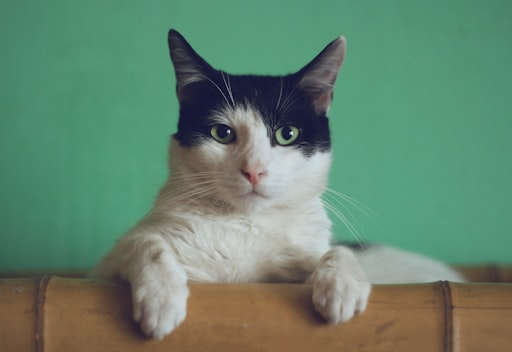

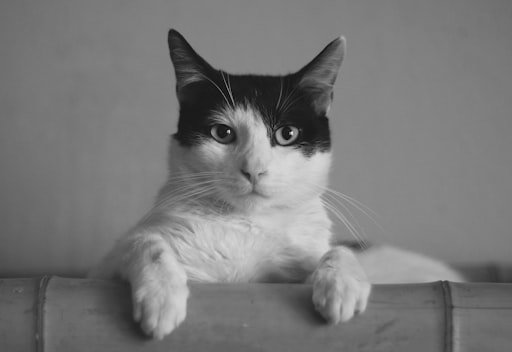

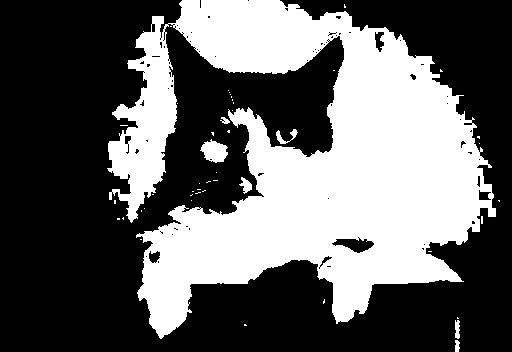

k = 2:


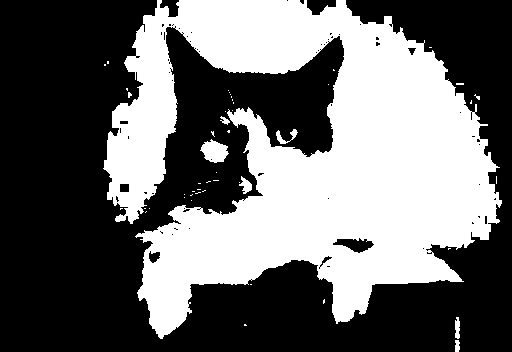

k = 4:


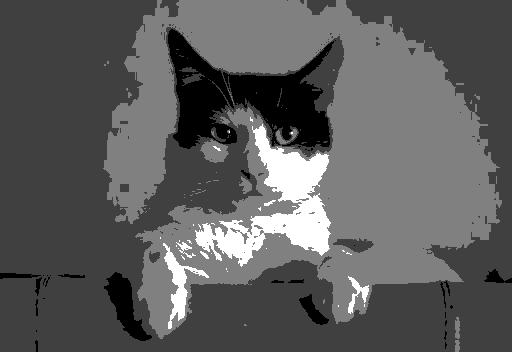

In [21]:
URL = 'https://images.unsplash.com/photo-1514888286974-6c03e2ca1dba?auto=format&fit=crop&q=80&w=512&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D'
colored_image = read_image_from_url(URL)
k = 2 # Number of Bins
cv2_imshow(colored_image)

# TODO: Convert the image to grayscale
gray_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

# TODO: Convert the grayscale image to binary
threshold_value = 128
max_value = 255
ret, binary_image = cv2.threshold(gray_image, threshold_value, max_value, cv2.THRESH_BINARY)
cv2_imshow(binary_image)

# Divide the grayscale image into k bins
def divide_into_bins(image, k):
    bin_size = 256 // k
    binned_image = np.zeros_like(image)

    for i in range(k):
        lower_bound = i * bin_size
        upper_bound = lower_bound + bin_size
        representative = upper_bound - 1 if i == k - 1 else lower_bound
        binned_image[(image >= lower_bound) & (image < upper_bound)] = representative

    return binned_image

# k = 2 bins
print(f"k = 2:")
binned_image = divide_into_bins(gray_image, k)
cv2_imshow(binned_image)

# k = 4 bins
k = 4
print(f"k = 4:")
binned_image = divide_into_bins(gray_image, k)
cv2_imshow(binned_image)

<hr>
<font face="B Mitra" >
<div dir=rtl>

<font size=5>
<b> 6. تغییر اندازه تصاویر در OpenCV</b>
</font>

<br>
<p>
<font size=4>
تغییر اندازه تصاویر یک عملیات اساسی در پردازش تصویر و بینایی کامپیوتری است. این به شما امکان می دهد ابعاد یک تصویر را تغییر دهید و آن را کوچکتر یا بزرگتر کنید.

تابع ()cv2.resize برای تغییر اندازه تصاویر در OpenCV استفاده می شود. سه آرگومان اصلی را می طلبد:(آرگومان‌های دیگری هم داریم که الان به آنها نمی‌پردازیم)
</font>
<ol>
  <li>src: تصویر اصلی که می‌خواهیم آنرا تغییر دهیم.</li>
  <li>‌dsize: اندازه تصویر خروجی که می‌توان آنرا به صورت یک tuple نشان داد. مثلا (width, height)</li>
  <li>fx: ضریب مقیاس در امتداد محور افقی</li>
  <li>fy: ضریب مقیاس در امتداد محور عمودی</li>
</ol>
</p>

</div>
</font>

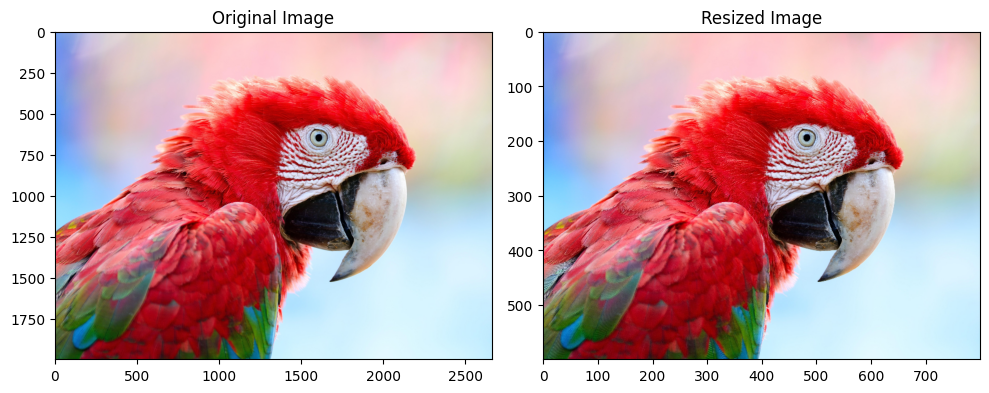

In [22]:
image = read_image_from_url("https://media.newyorker.com/photos/62c4511e47222e61f46c2daa/4:3/w_2663,h_1997,c_limit/shouts-animals-watch-baby-hemingway")

# Define the new dimensions (width, height)
new_width = 800
new_height = 600
new_dimensions = (new_width, new_height)

# Resize the image using cv2.resize()
resized_image = cv2.resize(image, new_dimensions)

# Display the original and resized images
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

# Resized Image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Resized Image')

plt.tight_layout()
plt.show()


<font face="B Mitra">
<div dir=rtl>

<font size=5>
<b>تمرین 5:</b>
</font>

<br>
<p>
<font size=4>
 لینک یک عکس دلخواه را برداشته: </font>
<ol>
  <li> تصویر مورد نظر را از ابعاد اصلی به ابعاد 640x480 تغییر دهید.</li>
  <li> تصویر اصلی را در عین حفظ نسبت تصویر(aspect ratio) به دو برابر ابعاد اصلی تغییر دهید.</li>
</ol>
</p>

<p>می‌توانید از matplotlib یا OpenCV برای نمایش تصاویر استفاده کنید.</p>

</div>
</font>

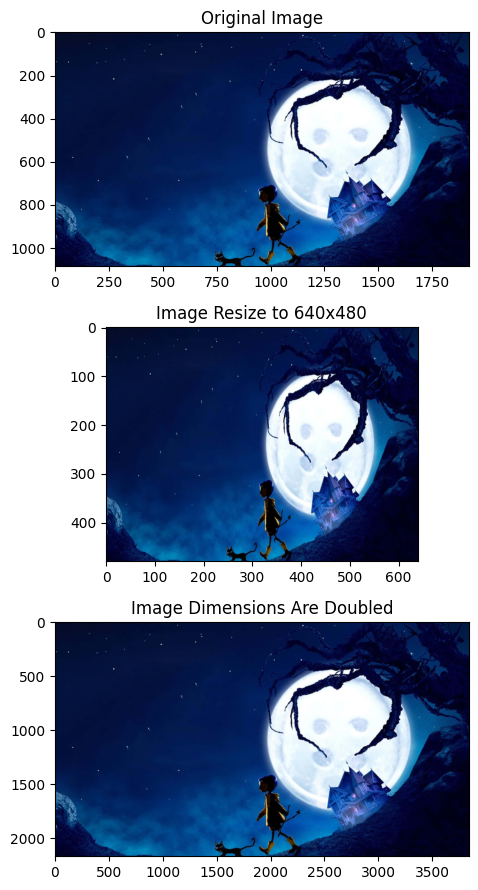

In [23]:
# Your desired image
URL = 'https://wallpapers.com/images/hd/coraline-background-abpb3f3z9w19dxls.jpg'
original_image = read_image_from_url(URL)

# TODO: Resize the image to have dimensions 640x480
new_dimensions = (640, 480)
resized_image = cv2.resize(original_image, new_dimensions)

plt.figure(figsize=(10, 9))

plt.subplot(3, 1, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(3, 1, 2)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Image Resize to 640x480')

# TODO: Resize the image to double its original width while maintaining the aspect ratio
# --- Solution 1 ---
doubled_image = cv2.resize(original_image, (0, 0), fx=2, fy=2)

# --- Solution 2 ---
# original_height, original_width = original_image.shape[:2]
# new_width = original_width * 2
# new_height = int(original_height * (new_width / original_width))
# doubled_image = cv2.resize(original_image, (new_width, new_height))

plt.subplot(3, 1, 3)
plt.imshow(cv2.cvtColor(doubled_image, cv2.COLOR_BGR2RGB))
plt.title('Image Dimensions Are Doubled')

plt.tight_layout()
plt.show()

<hr>
<font face="B Mitra">
<div dir=rtl>

<font size=5>
<b>7. تنظیم ناحیه مورد نظر از تصویر</b>
</font>

<br>
<p>
<font size=4>
گاهی اوقات، شما باید با مناطق خاصی از تصاویر بازی کنید. برای تشخیص چشم در تصاویر، ابتدا تشخیص چهره در کل تصویر انجام می‌شود. وقتی چهره‌ای به دست می‌آید، ناحیه صورت را به تنهایی انتخاب می‌کنیم و به جای جستجوی کل تصویر، چشم‌ها را در داخل آن جستجو می‌کنیم. زیرا دقت را بهبود می‌بخشد (چون چشم‌ها همیشه روی صورت هستند) و سرعت را افزایش می‌دهد (زیرا ما در یک منطقه کوچک جستجو می‌کنیم).

به عنوان مثال به شکل زیر توجه کنید:
</font>
</p>
</div>

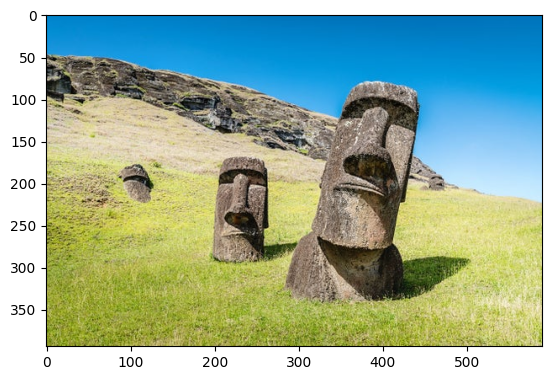

In [ ]:
img = read_image_from_url("https://static.scientificamerican.com/sciam/cache/file/DB4E849F-5267-4A4C-A8A1F8AB1344C945_source.jpg?w=590&h=800&8397FFEE-1F26-49BC-98ECB53FE3F8A6D6")
new_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert the image to RGB
plt.imshow(new_img)
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
حال ما میخواهیم یکی کپی از یکی از مجسمه‌ها در تصویر ایجاد کنیم.
</font>
</p>


</div>
</font>

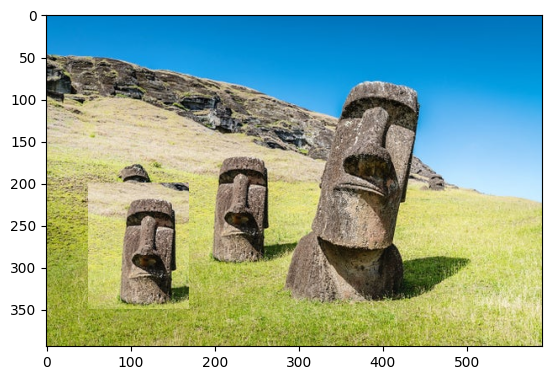

In [ ]:
statue = new_img[150:300, 160:280]
new_img[200:350, 50:170] = statue
plt.imshow(new_img)
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین 6:</b>
</font>

<br>
<p>
<font size=4>
توپ موجود در تصویر را در یک ناحیه به دلخواه کپی و در آخر آن را نمایش دهید.
</font>
</p>

</div>
</font>

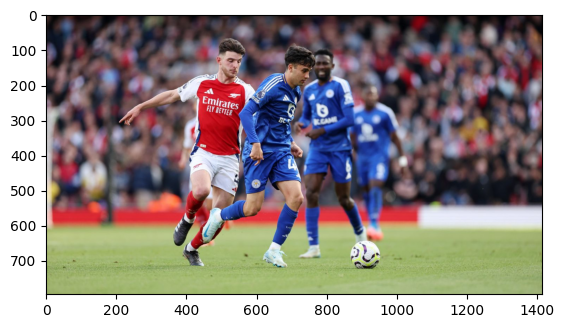

In [ ]:
url = "https://resources.lcfc.com/photo-resources/2024/09/28/b5b19a96-8061-4483-839e-1de5f04fa1b9/NPR36043.JPG?width=1415&height=796"
test_img = read_image_from_url(url)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
plt.imshow(test_img)
plt.show()

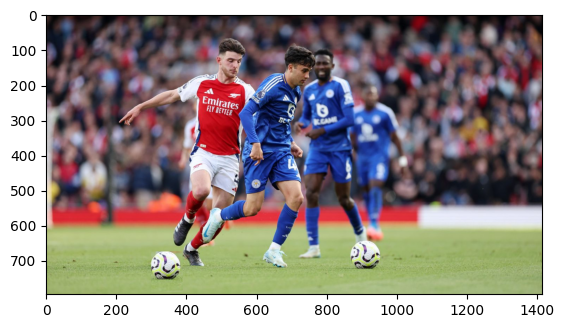

In [ ]:
# TODO: Image ROI
ball = test_img[645:760, 870:960]
test_img[675:790, 300:390] = ball
plt.imshow(test_img)
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b> تمرین 7: </b>
</font>

<br>
<p>
<font size=4>

تابع prepare_triangle(image_height, image_width) به ما یک تصویر با پس زمینه سفید که درون آن یک مثلث سبز توخالی وجود دارد می‌دهد.

 در ادامه با نحوه‌ی کشیدن انواع اشکال با استفاده از openCv آشنا میشویم اما در این تمرین نحوه‌‌ی عملکرد این تابع مدنظر نمی‌باشد و صرفا آنرا تابعی تصور کنید که برای شما به هر نحوی یک مثلث با شرایط گفته شده را میکشید.

<font color = "lightgreen">

با استفاده از پیمایش روی پیکسل‌های هر کانال، درون مثلث را به رنگ آبی در آورید و سپس آنرا نمایش دهید.
</font>


دقت کنید که نقاطی از تصویر به رنگ سفید هستند که rgb آنها برابر (255, 255, 255) باشد و نقاطی از تصویر نیز به رنگ سبز هستند کهrgb آنها برابر (0, 255, 0)

</font>
</p>


</div>
</font>

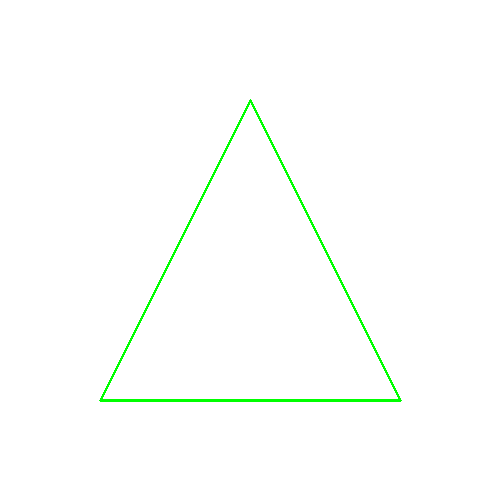

In [ ]:
def prepare_triangle(image_height, image_width):
  # white background
  triangle_image = np.ones((image_height, image_width, 3), dtype=np.uint8) * 255

  # (x, y) coordinates of the triangle's vertices
  triangle_points = np.array([[250, 100], [100, 400], [400, 400]], np.int32)

  # Reshape points for fillPoly function
  triangle_points = triangle_points.reshape((-1, 1, 2))

  # Draw the green triangle
  cv2.polylines(triangle_image, [triangle_points], isClosed=True, color=(0, 255, 0), thickness=2)

  return triangle_image

# size of the image (height, width)
image_height = 500
image_width = 500
triangle_image = prepare_triangle(image_height, image_width)
cv2_imshow(triangle_image)

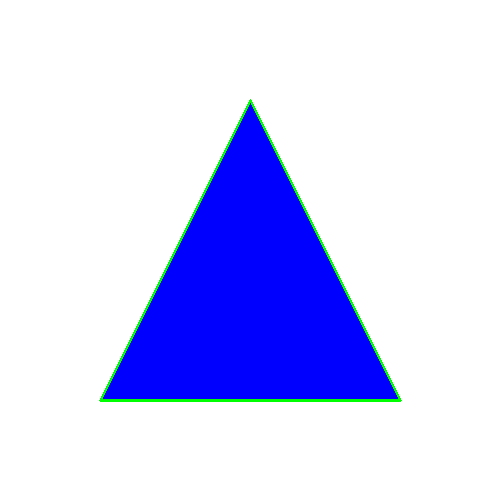

In [ ]:
blue, green, red = triangle_image[:, :, 0], triangle_image[:, :, 1], triangle_image[:, :, 2]

# TODO
### Start
for y in range(image_height):
    for x in range(image_width):
        if blue[y, x] == 255 and green[y, x] == 255 and red[y, x] == 255:
            if cv2.pointPolygonTest(np.array([[250, 100], [100, 400], [400, 400]], np.int32), (x, y), False) >= 0:
                blue[y, x] = 255
                green[y, x] = 0
                red[y, x] = 0
### END

new_triangle = np.dstack((blue, green ,red))
cv2_imshow(new_triangle)

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>8. عملیات حسابی بر روی تصاویر</b>
</font>

<br>
<p>
<font size=4>
OpenCV توابع زیادی برای انجام ریاضیات روی تصاویر دارد. برخی از این توابع «مشابه» در Numpy دارند، اما تقریباً همیشه بهتر است از نسخه OpenCV استفاده کنید. دلیل این امر این است که OpenCV برای کار بر روی تصاویر طراحی شده است و بنابراین Overflow را بهتر مدیریت می‌کند. در ادامه به چند مورد از این توابع اشاره خواهیم کرد.
</font>
</p>


</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>اضافه کردن تصاویر به یکدیگر</b>
</font>

</div>
</font>

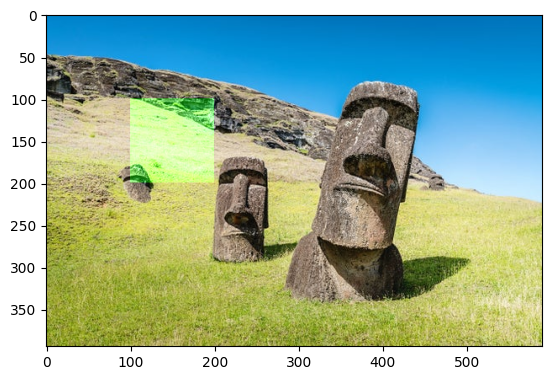

In [ ]:
## Adding two images with the same size to each other:
blank_image = np.zeros((img.shape), np.uint8)
blank_image[100:200,100:200,1] = 100 # make a green square in the blank image
# plt.imshow(blank_image) # if you want to check the blank_image first uncomment this line and comment the last line.
new_image=cv2.add(blank_image,img) # add function which adds two images to each other.
plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=4>
همچنین می‌توان تصاویر را به صورت وزن دار به هم اضافه کرد یعنی:
</font>

</div>
</font>


$$Result = α · img1 + β · img2 + γ$$

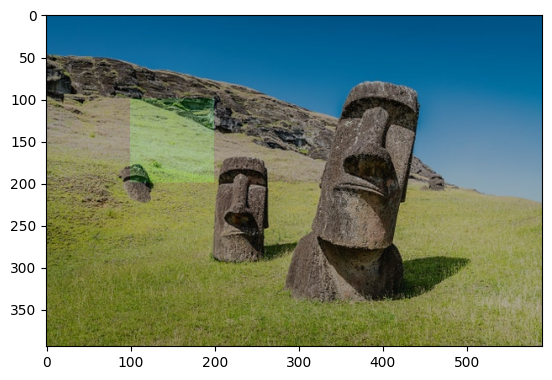

In [ ]:
result = cv2.addWeighted(img, 0.7, blank_image, 0.3, 0) # change the numbers
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین 7</b>
</font>

<br>
<p align="justify">
<font size=4>
دو تصویر زیر را به نسبت دلخواه ترکیب کنید.

نکته: اندازه دو تصویر باید یکی باشند.
</font>
</p>

</div>
</font>

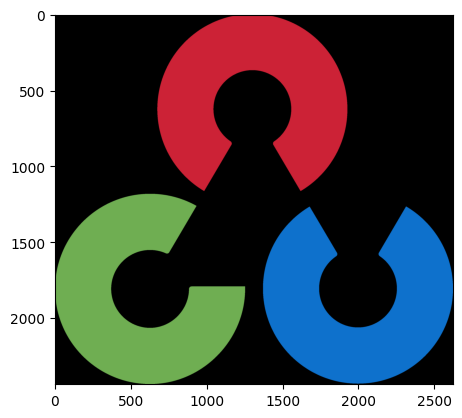

In [ ]:
## TODO
url1 = "https://github.com/opencv/opencv/wiki/logo/OpenCV_logo_no_text.png"
img1 = read_image_from_url(url1)
img2 = np.zeros((img1.shape), np.uint8)
### START
img3 = cv2.addWeighted(img1, 0.8, img2, 0.2, 0)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
plt.show()
### END

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>رسم یک خط</b>
</font>

</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=4>
 برای این کار از تابع cv2.line استفاده می‌کنیم.
سینتکس این تابع به شکل زیر است:

$$line(img, pt1, pt2, color[, thickness[, lineType[, shift]]]) -> img$$



آرگومان‌هایی که باید بر روی آن‌ها تمرکز کنیم عبارتند از:

*   img: تصویری که می‌خواهیم روی آن خط بکشیم
*   pt1: اولین نقطه (موقعیت x و y) از بخش خط
*   pt2: دومین نقطه از بخش خط
*   color: رنگ خطی که قرار است کشیده شود


این آرگومان‌ها اجباری هستند. سایر آرگومان‌ها که اختیاری هستند و مهم هستند، عبارتند از:



*   thickness: عدد صحیحی که ضخامت خط را مشخص می‌کند. مقدار پیش‌فرض ۱ است.
*   lineType: نوع خط. مقدار پیش‌فرض ۸ است که به معنای خط ۸-اتصال است. معمولاً از cv2.LINE_AA (خط هموار) استفاده می‌شود.
</font>

</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=4>
به کد زیر توجه کنید.

</font>

</div>
</font>


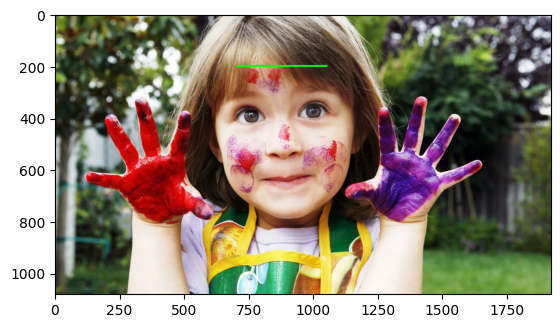

In [ ]:
image = read_image_from_url('https://images.inc.com/uploaded_files/image/1920x1080/getty_168318604_69878.jpg')

# a green line on the forehead
# The line starts from (700, 200) and ends at (1050, 200)
# Color is green (0, 255, 0) in BGR
# Thickness of line is 5px
# Linetype is cv2.LINE_AA
cv2.line(image, (700, 200), (1050, 200), (0, 255, 0), thickness=5, lineType=cv2.LINE_AA)

plt.imshow(image[:,:,::-1])
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>رسم یک دایره</b>
</font>

</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>


<font size=4>
حالا بیایید نگاهی به تابع cv2.circle بیندازیم که می‌توان از آن برای رسم دایره روی یک تصویر استفاده کرد.
سینتکس تابع:

$$circle(img, center, radius, color[, thickness[, lineType[, shift]]]) -> img$$



آرگومان‌هایی که باید بر روی آن‌ها تمرکز کنیم عبارتند از:

*   img: تصویری که دایره روی آن کشیده می‌شود.
*   center: مرکز دایره.
*   radius: شعاع دایره.
*   color: رنگ دایره.



این آرگومان‌ها اجباری هستند. سایر آرگومان‌ها که اختیاری هستند و مهم هستند، عبارتند از:


*   thickness: ضخامت خط دور دایره (اگر مثبت باشد). اگر مقدار منفی برای این آرگومان وارد کنید، دایره پر خواهد شد.
*   lineType: نوع مرز دایره. این آرگومان همانند lineType در تابع cv2.line است.


</font>

</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین 8</b>
</font>

<br>
<p align="justify">
<font size=4>
دایره‌ای با مرکز بینی و شعاعی که تقریباً کل صورت را بپوشاند، رسم کنید.

 مرکز را (875, 400) و شعاع را  350 می‌توانید درنظر بگیرید.
</font>
</p>

</div>
</font>

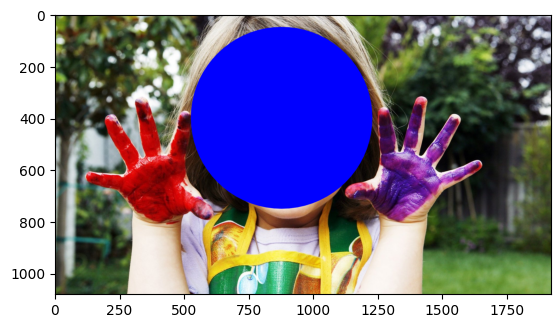

In [ ]:
image = read_image_from_url('https://images.inc.com/uploaded_files/image/1920x1080/getty_168318604_69878.jpg')

# Draw a circle with center on the nose and radius 100
## TODO
### Start
cv2.circle(image, (875, 400), 350, (255, 0, 0), thickness=-1, lineType=cv2.LINE_AA)
### END

# Display the image
plt.imshow(image[:,:,::-1])
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>افزودن متن</b>
</font>

</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>


<font size=4>
در نهایت، بیایید ببینیم چگونه می‌توانیم با استفاده از تابع cv2.putText متنی را روی یک تصویر بنویسیم.

سینتکس تابع:

$$putText(img, text, org, fontFace, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]]) -> img$$



آرگومان‌هایی که باید بر روی آن‌ها تمرکز کنیم عبارتند از:

*   img: تصویری که روی آن متن نوشته می‌شود.
*   text: رشته‌ی متنی که باید نوشته شود.
*   org: گوشه‌ی پایین-چپ رشته‌ی متنی در تصویر.
*   fontFace: نوع فونت
*   fontScale: ضریب مقیاس فونت که بر اساس اندازه پایه فونت ضرب می‌شود.
*   color: رنگ فونت

</font>

</div>
</font>

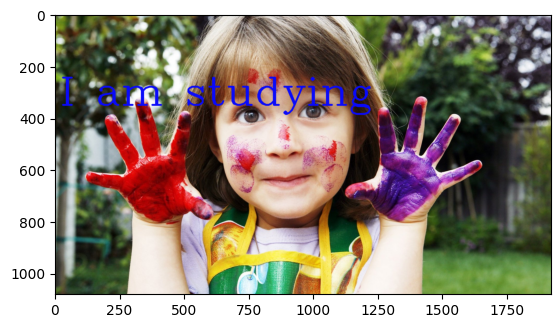

In [ ]:
image = read_image_from_url('https://images.inc.com/uploaded_files/image/1920x1080/getty_168318604_69878.jpg')
text = "I am studying"
fontScale = 5
fontFace = cv2.FONT_HERSHEY_COMPLEX
fontColor = (250, 10, 10)
fontThickness = 5
cv2.putText(image, text, (20, 350), fontFace, fontScale, fontColor, fontThickness, cv2.LINE_AA);

plt.imshow(image[:,:,::-1])
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>عملیات بیتی (Bitwise Operations)</b>
</font>

<br>
<p>
<font size=3>
شامل عملیات بیتی AND، OR، NOT و XOR می‌شود. هنگام استخراج هر قسمت از تصویر که  ناحیه‌هایی غیر مستطیلی است بسیار مفید خواهند بود. در زیر نمونه‌ای از نحوه تغییر
یک منطقه خاص از یک تصویر را مشاهده خواهیم کرد.

</font>
</p>

</div>
</font>

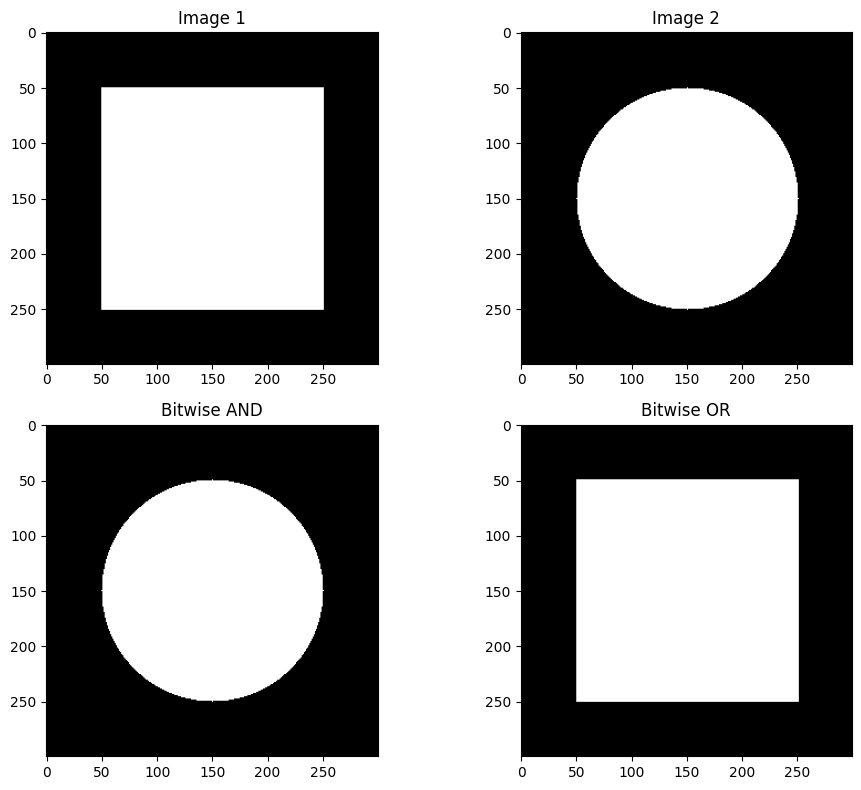

In [ ]:
img1 = np.zeros((300, 300), dtype=np.uint8)
img2 = np.zeros((300, 300), dtype=np.uint8)

# Draw a white rectangle on img1
cv2.rectangle(img1, (50, 50), (250, 250), 255, -1)

# Draw a white circle on img2
cv2.circle(img2, (150, 150), 100, 255, -1)

# Bitwise AND operation
bitwise_and = cv2.bitwise_and(img1, img2)

# Bitwise OR operation
bitwise_or = cv2.bitwise_or(img1, img2)

plt.figure(figsize=(10, 8))
plt.subplot(221), plt.imshow(img1, 'gray'), plt.title('Image 1')
plt.subplot(222), plt.imshow(img2, 'gray'), plt.title('Image 2')
plt.subplot(223), plt.imshow(bitwise_and, 'gray'), plt.title('Bitwise AND')
plt.subplot(224), plt.imshow(bitwise_or, 'gray'), plt.title('Bitwise OR')

plt.tight_layout()
plt.show()


<font face="B Mitra">
<div dir=rtl>

<font size=5>
<b>تمرین 9</b>
</font>

<br>
<font size=4>
<b>استفاده از عملیات بیتی برای اعمال فیلتر عینک آفتابی </b>
</font>

<br>
<p align="justify">
<font size=4>
برای درک بهتر استفاده از این توابع، قصد داریم یک عینک آفتابی را روی صورت ایلان ماسک قرار دهیم.
</font>
</p>

</div>
</font>

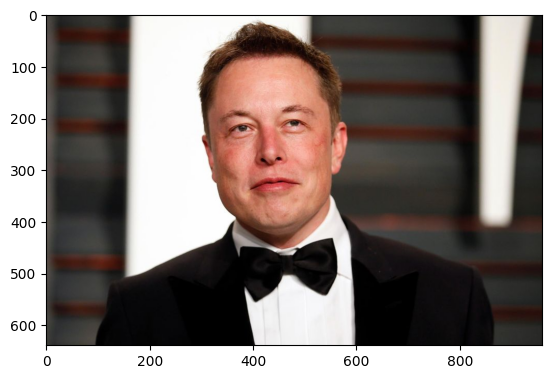

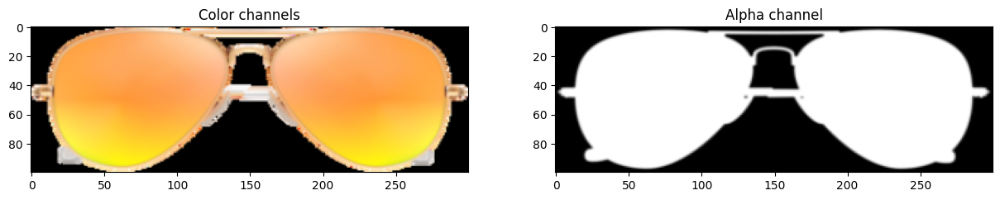

In [ ]:
# Load the Face Image
faceImage = read_image_from_url('https://image.gala.de/21270186/t/JB/v5/w960/r1.5/-/elon-musk--11584341-.jpg')
plt.imshow(faceImage[...,::-1])
faceWithGlassesBitwise = faceImage.copy()

# Load the Sunglass image with Alpha channel
glassPNG = read_image_from_url('https://www.picng.com/thumbnail/sunglasses/png_sunglasses_34639_small.png', -1)

# Resize the image to fit over the eye region
glassPNG = cv2.resize(glassPNG,(300,100))

# Separate the Color and alpha channels
glassBGR = glassPNG[:,:,0:3]
glassMask1 = glassPNG[:,:,3]

# Display the images for clarity
plt.figure(figsize=[15,15])
plt.subplot(121);plt.imshow(glassBGR[:,:,::-1]);plt.title('Color channels');
plt.subplot(122);plt.imshow(glassMask1,cmap='gray');plt.title('Alpha channel');

<font face="B Mitra" size=5>
<div dir=rtl>

<p align="justify">
<font size=4>
در بلاک بالا تصاویر ایلان ماسک و عینک مورد نظر را خواندیم. نکته‌ای که باید به آن توجه کنید این است که فرمت تصویر عینک PNG است. در تصاویر PNG علاوه بر سه کانال رنگی BGR یک کانال alpha نیز داریم که نشان دهنده میزان شفافیت پیکسل‌ها می‌باشد. هرچه مقدار کانال alpha در یک پیکسل کمتر باشد شفایفت آن بیشتر خواهد بود و در صورتی که alpha یک پیکسل برابر با 0 باشد، آن پیکسل در تصویر نمایش داده نخواهد شد. حال شما باید چند عملیات زیر را انجام دهید:
<font size=4, color='lightgreen'>
<ol>
<li>ناحیه چشم که قصد داریم عینک را در آن قرار دهیم با استفاده از عملیات بیتی مناسب و کانال آلفا تصویر عینک، خالی کنید.(مقدار پیکسل‌ها در این ناحیه برابر با صفر شود)</li>
<li>ناحیه‌ای از عینک که قصد انقال آن را داریم با استفاده از عملیات بیتی مناسب
 و کانال آلفا، نگه دارید.</li>
<li>در نهایت ناحیه مشخص شده از عینک و نواحی نگه داشته شده از چشم‌ها را با استفاده از عملیات بیتی مناسب با یک دیگر ترکیب کنید.</li>
</ol>
</font>
</p>

</div>
</font>

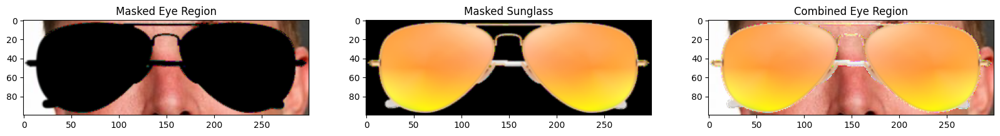

In [ ]:
# Get the eye region from the face image
eyeROI= faceWithGlassesBitwise[180:280,280:580]

# Make the dimensions of the mask same as the input image.
# Since Face Image is a 3-channel image, we create a 3 channel image for the mask
glassMask = cv2.merge((glassMask1,glassMask1,glassMask1))

## TODO
### Start
# Use the mask to create the masked eye region
eye = cv2.bitwise_and(cv2.bitwise_not(glassMask), eyeROI)

# Use the mask to create the masked sunglass region
sunglass = cv2.bitwise_and(glassBGR, glassMask)

# Combine the Sunglass in the Eye Region to get the augmented image
eyeRoiFinal = cv2.bitwise_or(eye, sunglass)

### End
# Display the intermediate results
plt.figure(figsize=[20,20])
plt.subplot(131);plt.imshow(eye[:,:,::-1]);plt.title("Masked Eye Region");
plt.subplot(132);plt.imshow(sunglass[:,:,::-1]);plt.title("Masked Sunglass");
plt.subplot(133);plt.imshow(np.uint8(eyeRoiFinal)[:,:,::-1]);plt.title("Combined Eye Region");

<font face="B Mitra" size=5>
<div dir=rtl>

<p align="justify">
<font size=4>
در نهایت تصویر با عینک به دست آمده را جایگزین ناحیه مورد نظر در تصویر اصلی کنید.

</font>
</p>

</div>
</font>

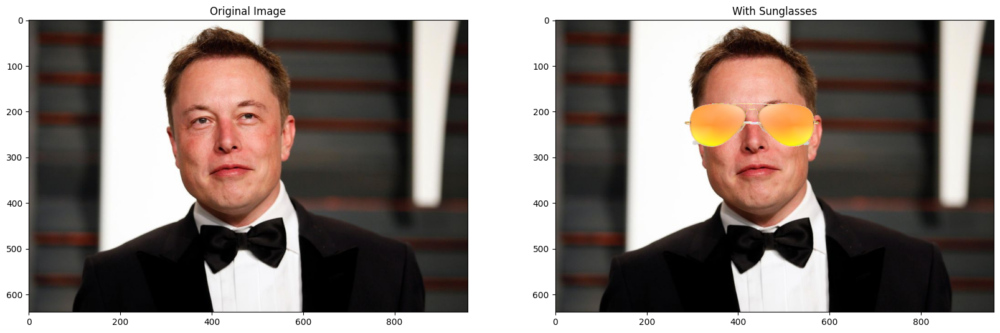

In [ ]:
# Replace the eye ROI with the output from the previous section

## TODO
### Start
faceWithGlassesBitwise[180:280,280:580] = eyeRoiFinal
### END

# Display the final result
plt.figure(figsize=[20,20]);
plt.subplot(121);plt.imshow(faceImage[:,:,::-1]); plt.title("Original Image");
plt.subplot(122);plt.imshow(faceWithGlassesBitwise[:,:,::-1]);plt.title("With Sunglasses");


<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۷. عملیات ابتدایی در پردازش تصویر</b>
</font>

<br>
<p>
<font size=4>
حال که با عملیات ابتدایی در OpenCV آشنا شده‌اید قصد داریم کمی با عملیات ابتدایی در پردازش تصویر آشنا شویم.
</font>
</p>


</div>
</font>

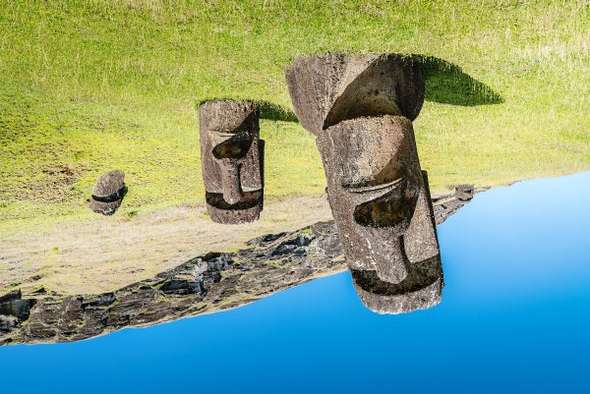

In [ ]:
img = read_image_from_url("https://static.scientificamerican.com/sciam/cache/file/DB4E849F-5267-4A4C-A8A1F8AB1344C945_source.jpg?w=590&h=800&8397FFEE-1F26-49BC-98ECB53FE3F8A6D6")
flipped_code_0 = cv2.flip(img,0) # vertical flip
cv2_imshow(flipped_code_0)

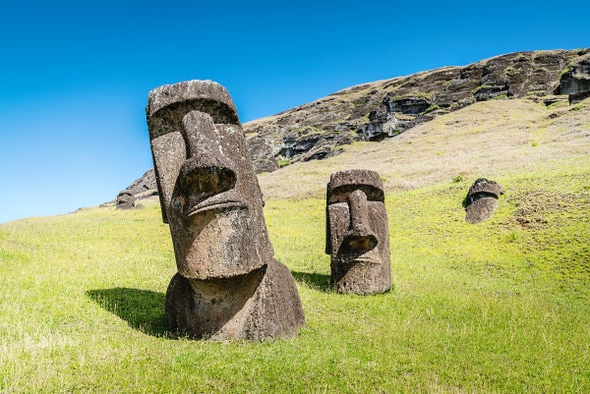

In [ ]:
flipped_code_1 = cv2.flip(img,1) # horizontal flip
cv2_imshow(flipped_code_1)

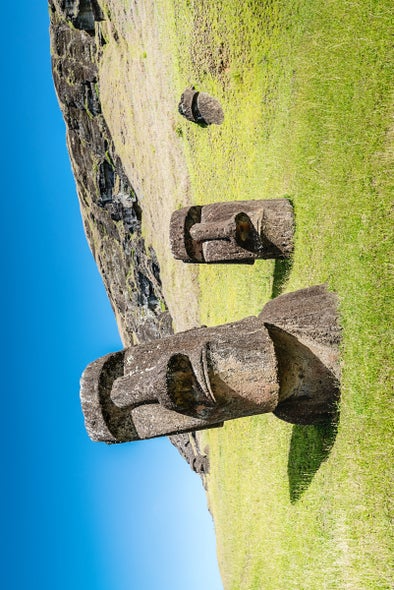

In [ ]:
transposed = cv2.transpose(img)
cv2_imshow(transposed)

<font face="B Mitra" size=5>
<div dir=rtl>
<font size=4>
در OpenCV، برای انجام دوران (Rotation) تصاویر از تابعی به نام cv2.getRotationMatrix2D استفاده می‌کنیم که ماتریس دوران دو بعدی را ایجاد می‌کند. این ماتریس سپس با استفاده از تابع cv2.warpAffine روی تصویر اعمال می‌شود تا تصویر حول یک نقطه مشخص (معمولاً مرکز تصویر) با زاویه دلخواه دوران یابد.

پارامترهای مهم تابع getRotationMatrix2D:
* center: نقطه‌ای که حول آن دوران انجام می‌شود. این معمولاً مرکز تصویر است.
* angle: زاویه دوران (بر حسب درجه).
* scale: مقیاس (معمولاً 1 است، ولی اگر بخواهیم تصویر را بزرگ یا کوچک کنیم تغییر می‌دهیم).


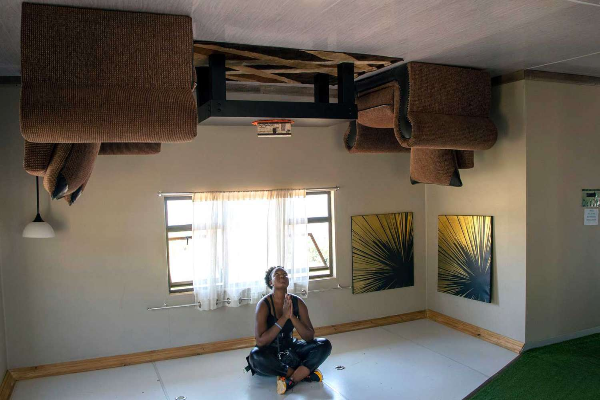

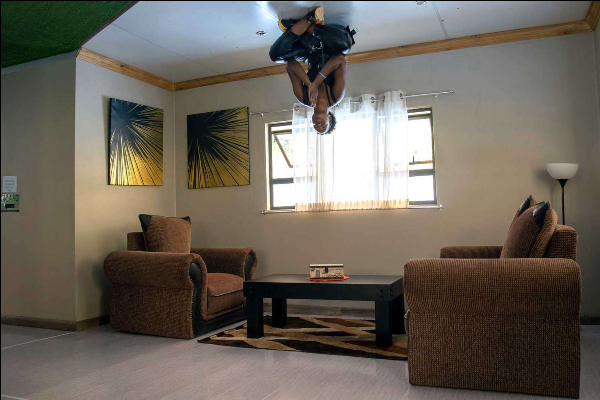

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = read_image_from_url("https://www.travelandleisure.com/thmb/ga-_DXZTJLpXD1lQd9tsbGSrZ7c=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/upside-down-house-hartbeespoort-south-africa-2-UPDOWNSA0320-214912c0a51f4eb598d708501563cf62.jpg")
image = cv2.resize(image, (600,400))

(h, w) = image.shape[:2]
center = (w // 2, h // 2)

angle = 180
scale = 1.0

M = cv2.getRotationMatrix2D(center, angle, scale)

rotated = cv2.warpAffine(image, M, (w, h))
cv2_imshow(image)
cv2_imshow(rotated)

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین 10</b>
</font>

<br>
<p align="justify">
<font size=4>
تابعی را پیاده‌سازی کنید که یک تصویر را با یک زاویه معین بدون استفاده از تابع‌ دوران در OpenCV و بدون نیاز به پرداختن به مسائل درونیابی یا برش یا تغییر اندازه مرز، دوران دهد.
<ol>
  <li>تابع باید یک تصویر و یک زاویه (به درجه) به عنوان ورودی دریافت کند.</li>
  <li>تابع باید تصویر دوران یافته را برگرداند.</li>
  <li>دوران در مرکز تصویر انجام می‌شود.</li>
  <li>بدلیل اینکه در این پیاده‌سازی از درونیابی استفاده نمی‌کنید ممکن است در تصویر دوران یافته نقاط سیاهی را مشاهده کنید.</li>
</ol>


<font size=4>
راهنمایی:

* یک نقطه (x,y) می‌تواند در حول مبدا (0,0) با یک زاویه θ با استفاده از معادلات زیر چرخیده شود:



$$ x' = x \cos(\theta) - y \sin(\theta) $$
$$y' = x \sin(\theta) + y \cos(\theta) $$

<font face="B Mitra">
<div dir=rtl>
<p>

*   برای دوران در حول مرکز تصویر، ابتدا تصویر را به گونه‌ای جابجا کنید که مرکز آن در مبدا قرار گیرد، سپس دوران را اعمال کنید و در نهایت آن را به مکان اصلی برگردانید.
*   دقت کنید که زاویه باید به رادیان تبدیل شود.

</p>
</div>
</font>

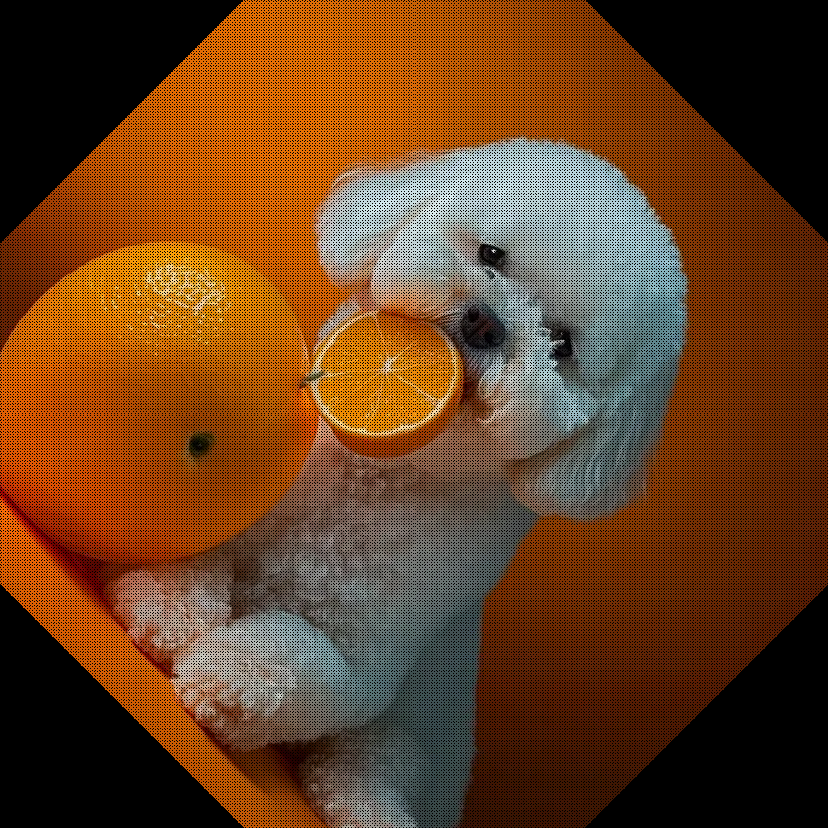

In [ ]:
## TODO5:
def rotate_image(img, angle):
  ### START
  rotated_img = np.zeros_like(img)
  height, width = img.shape[:2]
  center_x, center_y = width // 2, height // 2

  theta = math.radians(angle)
  cos_theta = math.cos(theta)
  sin_theta = math.sin(theta)

  for y in range(height):
      for x in range(width):
          trans_x = x - center_x
          trans_y = y - center_y

          new_x = int(trans_x * cos_theta - trans_y * sin_theta) + center_x
          new_y = int(trans_x * sin_theta + trans_y * cos_theta) + center_y

          if (0 <= new_x < width) and (0 <= new_y < height):
              rotated_img[new_y, new_x] = img[y, x]

  return rotated_img
  ### END

test_url5 = "https://miro.medium.com/v2/resize:fit:828/format:webp/1*YMJDp-kqus7i-ktWtksNjg.jpeg"
test_img5 = read_image_from_url(test_url5)
rotated_img = rotate_image(test_img5, 45)
cv2_imshow(rotated_img)

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>ضبط ویدیو از وب‌کم </b>
</font>

<br>
<p>
<font size=4>
ضبط ویدیو از وب‌کم به شما اجازه می‌دهد که جریان‌های ویدیویی زنده را در زمان واقعی پردازش کنید.

 از تابع cv2.VideoCapture در OpenCV برای دسترسی و کنترل وب‌کم استفاده می‌شود، هر فریم را نمایش می‌دهد و ورودی‌های کاربر را برای مدیریت جریان ویدیو پردازش می‌کند. این بخش نحوه ضبط ویدیو از وب‌کم و نمایش آن بر روی صفحه را نشان می‌دهد.

<font size=4>
<b></font>
توابع و پارامترهای کلیدی:
</b>



*   cv2.VideoCapture(0): وب‌کم پیش‌فرض را باز می‌کند. آرگومان 0 به معنی شماره‌ی دوربین است. در صورتی که چندین دوربین متصل باشد، می‌توانید آن را به 1، 2 و غیره تغییر دهید.
*   cv2.imshow: هر فریم ضبط‌ شده را در یک پنجره نمایش می‌دهد.
*   cv2.waitKey(1) & 0xFF == ord('q'): منتظر رخداد کلیدی می‌ماند؛ اگر کلید 'q' فشرده شود، جریان ویدیو متوقف شده و پنجره بسته می‌شود.


<font size=4>
<b></font>
موارد استفاده:
</b>



*   پردازش زنده ویدیو: ضبط ویدیو برای وظایفی مانند تشخیص اشیا، شناسایی چهره یا ردیابی حرکت.
*   ضبط ویدیو: ذخیره ویدیو از وب‌کم برای استفاده یا تحلیل بعدی.
*   بازخورد زمان واقعی: نمایش ویدیو زنده با اضافه کردن روکش‌ها یا حاشیه‌نویسی‌ها، مانند رسم اشکال یا افزودن متن.


<font size=4>
<b></font>
نکات مهم:
</b>


*   مطمئن شوید که وب‌کم شما متصل است و مجوزهای لازم برای دسترسی OpenCV به آن فعال شده است.
*   وب‌کم را به درستی آزاد کنید و پنجره‌ها را ببندید تا از نشت منابع یا خرابی برنامه پس از پایان برنامه جلوگیری کنید.
* این کد به طور پیوسته فریم‌ها را ضبط کرده و نمایش می‌دهد تا زمانی که کلید 'q' برای متوقف کردن فشرده شود.


</font>
</p>

</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<br>
<p align="justify">
<font size=4>
برای درک بهتر به کد زیر توجه کنید.

</font>
</p>

</div>
</font>

In [ ]:
# Open the default camera
cap = cv2.VideoCapture(0)

# Check if the camera opened successfully
if not cap.isOpened():
    print("Error: Could not open the camera.")
    cap.release()  # Release the camera
    cv2.destroyAllWindows()
    exit()

try:
    # Continuously capture frames from the camera
    while True:
        # Read a frame from the camera
        ret, frame = cap.read()

        # Check if the frame was captured successfully
        if not ret:
            print("Error: Failed to capture frame.")
            break

        # Display the captured frame
        cv2.imshow('Camera Feed', frame)

        # Wait for 1 ms and check if the 'q' key was pressed to exit
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

except KeyboardInterrupt:
    print("Video feed stopped manually.")

finally:
    # Release the camera and close all OpenCV windows
    cap.release()
    cv2.destroyAllWindows()